![Alt text](https://production-media.paperswithcode.com/methods/Screen_Shot_2020-07-19_at_11.13.45_AM_zsF2pa7.png)



# Import Required Dependencies

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
import shutil
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, Flatten, Dense, add, BatchNormalization, Activation, LeakyReLU, Layer
from tensorflow.keras.models import Model
import tensorflow as tf
from PIL import Image

In [ ]:
PATH = '/kaggle/input/another-anime-face-dataset/animefaces256cleaner'
files_img = [os.path.join(PATH, x)for x in os.listdir(PATH)]

In [2]:
len(files_img)

92219

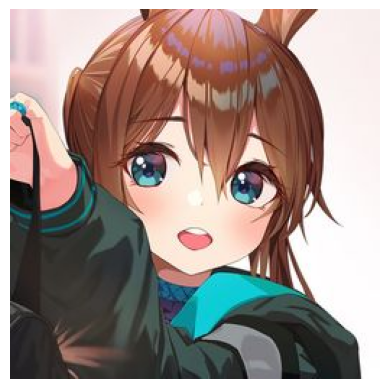

In [3]:
img = cv2.imread(files_img[201], cv2.IMREAD_UNCHANGED)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')  # to hide the axes
plt.show()

# DownSampling Images

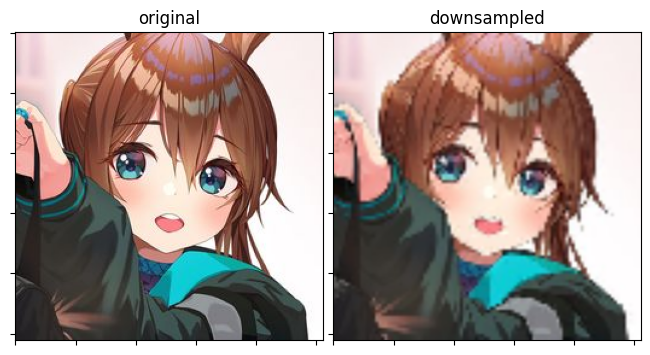

In [4]:
def plot_images(images, titles, figsize, rows=1, cols=1, axes_pad=(0.1, 0.5)):
    fig = plt.figure(figsize=figsize)
    grid = ImageGrid(fig, 111, nrows_ncols=(rows, cols), axes_pad=axes_pad)

    i = 0
    for ax, img in zip(grid, images):
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.set_title(titles[i])
        ax.minorticks_off()
        ax.set_xticklabels([])
        ax.set_yticklabels([])

        i += 1
    plt.show()
    

def downsample(img_file, scale=0.3):
    img = cv2.imread(img_file, cv2.IMREAD_UNCHANGED)
    img_small = cv2.resize(img, (0,0), fx=scale, fy=scale, interpolation = cv2.INTER_NEAREST)
    return img, img_small

_, img_small = downsample(files_img[201], scale=0.4)

# Lets resize the image for plotting purposes
img_small_resize = cv2.resize(img_small, (img.shape[0], img.shape[1]))

titles = ["original", "downsampled"]
images = [img, img_small_resize]
plot_images(images, titles, figsize=(10., 4.), cols=len(images))

In [5]:
output_dir = '/kaggle/working/downsampled_images'  # Directory path
os.makedirs(output_dir, exist_ok=True)

for file_img in files_img:
    img, img_small = downsample(file_img, scale=0.25)
    file_img_lr = os.path.join(output_dir, os.path.basename(file_img))
    cv2.imwrite(file_img_lr, img_small)

In [6]:
output_dir = '/kaggle/working/downsampled_images'
files_img_lr = [os.path.join(output_dir, x) for x in os.listdir(output_dir)]
print("HR images: {}, LR images: {}".format(len(files_img), len(files_img_lr)))

HR images: 92219, LR images: 92219


# Building Model

In [8]:
class SubpixelConv2D(Layer):

    def __init__(self, upsampling_factor=2, **kwargs): #  refers to the instance of the class that is being operated on.
        super(SubpixelConv2D, self).__init__(**kwargs) #init the parent class and allows you to call methods of a parent class.
        self.upsampling_factor = upsampling_factor

    def build(self, input_shape):
        last_dim = input_shape[-1] # No.of filters
        factor = self.upsampling_factor * self.upsampling_factor
        if last_dim % (factor) != 0:
            raise ValueError('Channel ' + str(last_dim) + ' should be of integer times of upsampling_factor^2: ' +
                             str(factor) + '.')

    def call(self, inputs, **kwargs):
        return tf.nn.depth_to_space(inputs, self.upsampling_factor) # convert input from (h, w, c) to (h*r, w*r, c/(r*r)),

    def get_config(self):   # returns a dictionary that contains the configuration of the layer
                            # Stores the hyperparameter of the layer if we want to edit it
        config = {'upsampling_factor': self.upsampling_factor}
        base_config = super(SubpixelConv2D, self).get_config()  #super() is a built-in function that allows you to call a method in a parent class(Layer).
        return dict(list(base_config.items()) + list(config.items()))

## Generator

In [9]:
def generator_model(input_shape):
    g_init = tf.random_normal_initializer(1., 0.02) #initialize weights with normal distribution (Mean, std)
    relu = Activation('relu')

    layer_input = Input(shape=input_shape)
    layer_past_block = Conv2D(64, (3,3), padding='SAME', activation= 'relu', kernel_initializer='HeNormal')(layer_input)
    # layer_initial = layer_past_block ==> to save first layer information for sum at the end of residual blocks(skip connection)
    layer_initial = layer_past_block

    # B residual blocks
    for i in range(3):
        layer = Conv2D(64, (3,3), padding='SAME', kernel_initializer='HeNormal')(layer_past_block)
        layer = BatchNormalization(gamma_initializer=g_init)(layer)

        layer = add([layer_past_block, layer])
        layer_past_block = layer

    layer = Conv2D(64, (3,3), padding='SAME', kernel_initializer='HeNormal')(layer_past_block)
    layer = BatchNormalization(gamma_initializer=g_init)(layer)
    layer = add([layer, layer_initial])  # adding initial layer, such that model can skip entire residual blocks
    # B residual blocks end

    #layer = layer_initial # extra

    layer = Conv2D(256, (3,3), padding='SAME', kernel_initializer='HeNormal')(layer)
    layer = SubpixelConv2D(upsampling_factor=2)(layer)
    layer = relu(layer)

    layer = Conv2D(256, (3,3), padding='SAME', kernel_initializer='HeNormal')(layer)
    layer = SubpixelConv2D(upsampling_factor=2)(layer)
    layer = relu(layer)

    #layer_final
    layer_final = Conv2D(3, (1,1), padding='SAME', kernel_initializer='HeNormal', activation= 'relu')(layer)

    model = Model(inputs=layer_input, outputs=layer_final, name="generator")
    return model

## Discriminator

In [10]:
# discriminator
def discriminator_model(input_shape):

    g_init= tf.random_normal_initializer(1., 0.02)

    ly_relu= LeakyReLU(alpha= 0.2)

    df_dim = 16

    layer_input = Input(input_shape)

    layer = Conv2D(64, (4, 4), (2, 2), padding='SAME', kernel_initializer='HeNormal')(layer_input)
    layer = ly_relu(layer)

    for i in range(2, 6):
        # Increasing No.of filters
        layer = Conv2D(df_dim*(2**i), (4, 4), (2, 2), padding='SAME', kernel_initializer='HeNormal')(layer)
        layer = ly_relu(layer)
        layer = BatchNormalization(gamma_initializer=g_init)(layer)

    layer = Conv2D(df_dim*16, (1, 1), (1, 1), padding='SAME', kernel_initializer='HeNormal')(layer)
    layer = ly_relu(layer)
    layer = BatchNormalization(gamma_initializer=g_init)(layer)

    layer = Conv2D(df_dim*8, (1, 1), (1, 1), padding='SAME', kernel_initializer='HeNormal')(layer)
    layer = BatchNormalization(gamma_initializer=g_init)(layer)
    layer_past = layer

    # Residual Block starts
    layer = Conv2D(df_dim*4, (3, 3), (1, 1), padding='SAME', kernel_initializer='HeNormal')(layer)
    layer = ly_relu(layer)
    layer = BatchNormalization(gamma_initializer=g_init)(layer)

    layer = Conv2D(df_dim*8, (3, 3), (1, 1), padding='SAME', kernel_initializer='HeNormal')(layer)
    layer = BatchNormalization(gamma_initializer= g_init)(layer)

    layer = add([layer, layer_past])
    # Residual Block ends

    layer = Flatten()(layer)
    layer_final = Dense(units=1, kernel_initializer='HeNormal', activation= 'sigmoid')(layer)
    model = Model(inputs=layer_input, outputs=layer_final, name="discriminator")

    return model

## VGG Model

In [25]:
def vgg19_model(input_shape):
    # Define input
    layer_input = Input(shape=input_shape)
    
    # Load VGG19 model with input_tensor set to layer_input
    vgg = tf.keras.applications.VGG19(
        include_top=False, 
        weights='imagenet',
        input_tensor=layer_input,  # Pass input here instead of manually invoking layers
        input_shape=input_shape,
        pooling=None
    )

    # Select the first 17 layers for your specific need
    model = Model(inputs=layer_input, outputs=vgg.layers[16].output, name='vgg')

    return model

## Hyper Parameters

In [13]:
learning_rate = 0.0002
n_epoch = 20       
n_epoch_init = 5  
batch_size = 16    
steps_per_epoch = 500

# create folders to save result images and trained models
img_save_dir = '/kaggle/working/samples'  # Directory path
os.makedirs(img_save_dir, exist_ok=True)
checkpoint_dir = '/kaggle/working/models'  # Directory path
os.makedirs(checkpoint_dir, exist_ok=True)

In [14]:
dataset_lr = tf.keras.utils.image_dataset_from_directory(output_dir, labels=None, image_size=(64, 64), batch_size=batch_size, shuffle=False)
dataset_hr = tf.keras.utils.image_dataset_from_directory(PATH, labels=None, image_size=(256, 256), batch_size=batch_size, shuffle=False)
dataset =  tf.data.Dataset.zip((dataset_lr, dataset_hr))

Found 92219 files.
Found 92219 files.


## Visualize Images

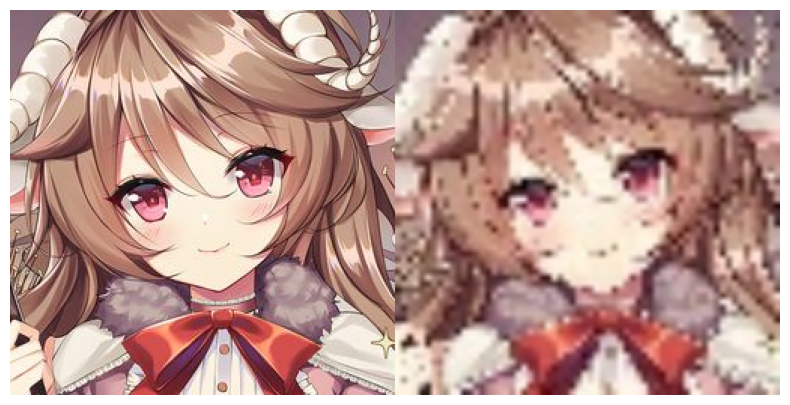

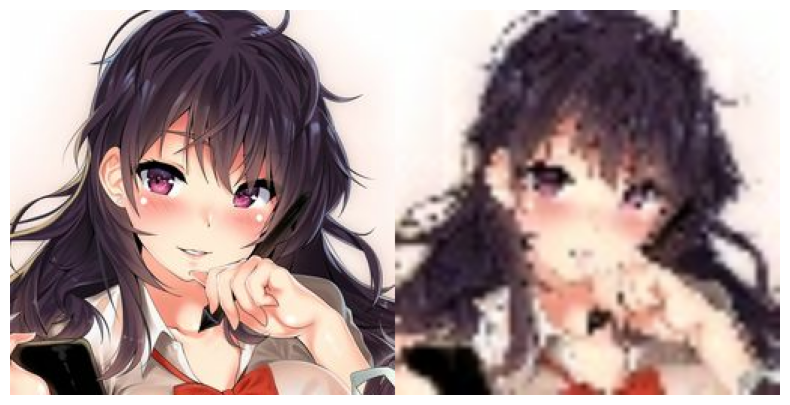

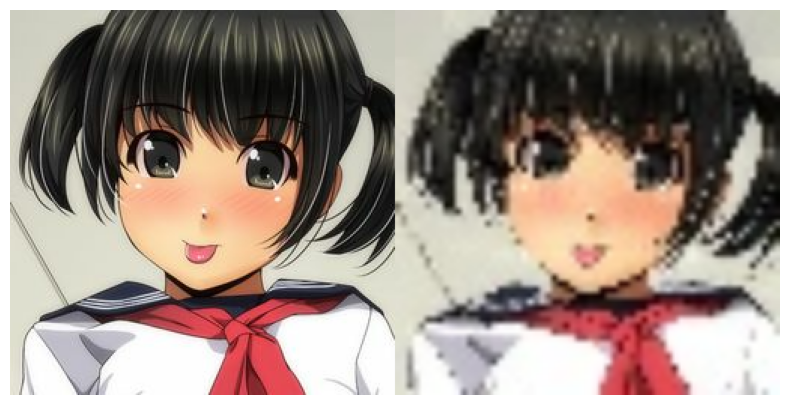

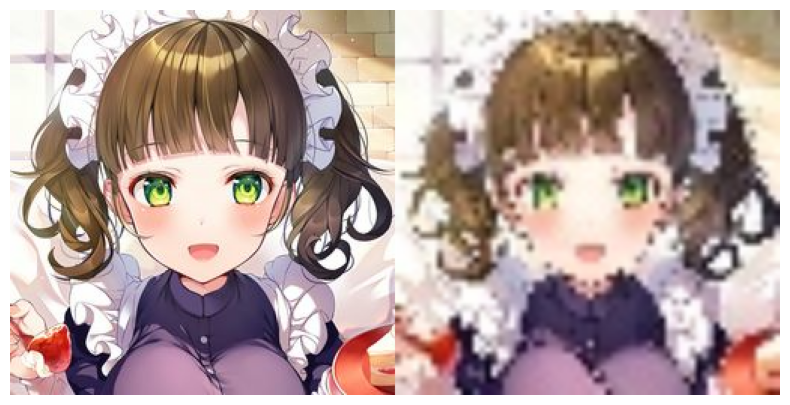

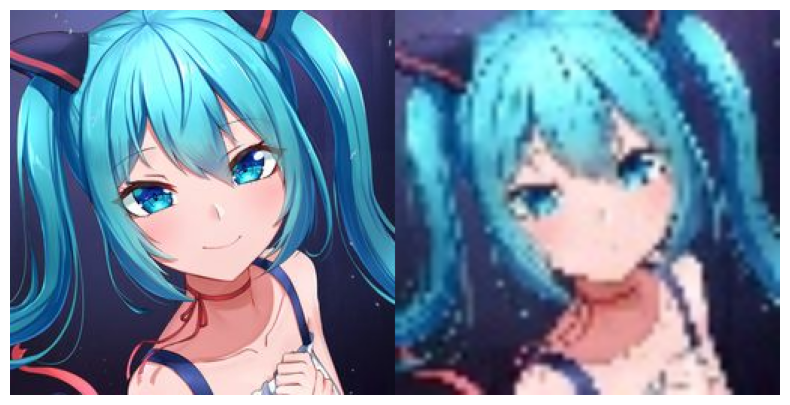

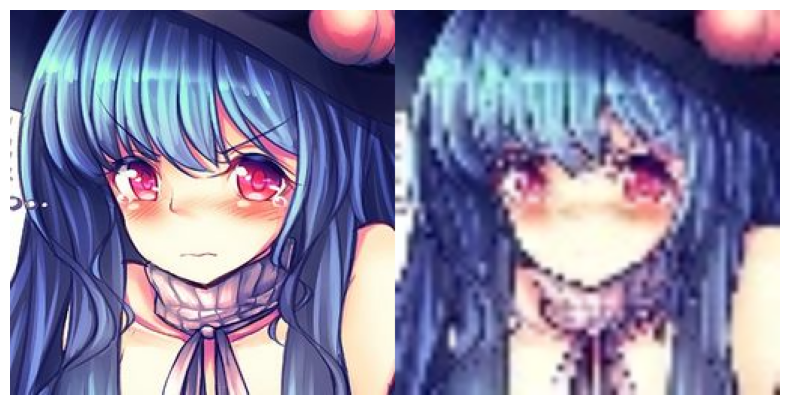

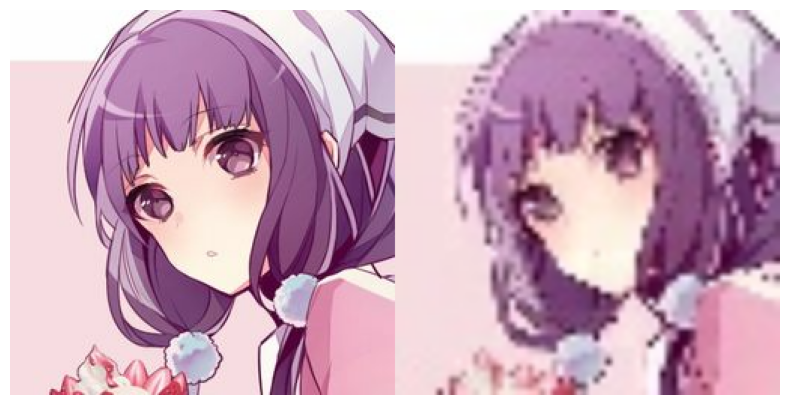

In [18]:
i = 0
for img_batch_lr, img_batch_hr in dataset:

    img_hr = img_batch_hr[0].numpy()
    img_lr = img_batch_lr[0].numpy()

    # Ensure the image has three channels (color image)
    if img_hr.shape[-1] == 1:
        img_hr = np.squeeze(img_hr, axis=-1)
        img_hr = np.stack([img_hr]*3, axis=-1)  # Convert grayscale to RGB for visualization
    
    if img_lr.shape[-1] == 1:
        img_lr = np.squeeze(img_lr, axis=-1)
        img_lr = np.stack([img_lr]*3, axis=-1)  # Convert grayscale to RGB for visualization

    img_lr_resize = cv2.resize(img_lr, (img_hr.shape[1], img_hr.shape[0]))

    # Ensure the image pixel values are within 0-255 range if using uint8 type
    if img_hr.max() > 1:  # If pixel values are above 1, scale them down
        img_hr = np.clip(img_hr, 0, 255).astype(np.uint8)
    if img_lr_resize.max() > 1:
        img_lr_resize = np.clip(img_lr_resize, 0, 255).astype(np.uint8)

    # Stack the high-res and resized low-res images horizontally
    combined_image = np.hstack([img_hr, img_lr_resize])

    # Display using matplotlib
    plt.figure(figsize=(10, 5))
    plt.imshow(combined_image)
    plt.axis('off')
    plt.show()

    if i > 5:
        break
    i += 1


In [27]:
model_gen = generator_model((64, 64, 3))
model_dis = discriminator_model((256, 256, 3))
model_vgg = vgg19_model((256, 256, 3))

In [28]:
g_optimizer_init = tf.optimizers.Adam(learning_rate) # train and test generator first alone
g_optimizer = tf.optimizers.Adam(learning_rate)
d_optimizer = tf.optimizers.Adam(learning_rate)

# Train Generator

In [29]:
g_optimizer_init = tf.optimizers.Adam(0.0002)

# Lets run generator for initial epochs
for epoch in range(n_epoch_init):
    for step, (X, Y) in enumerate(dataset): # X => downsampled img(input)
                                            # Y => Upsampled img(output/Target img)

        if step > steps_per_epoch:
            break

        with tf.GradientTape() as tape:
            Y_pred = model_gen(X)

            # Our loss function is MSE of pixel differences in actual and generated image
            mse_loss = tf.reduce_mean(tf.reduce_mean(tf.math.squared_difference(Y, Y_pred), axis=-1))
            grad = tape.gradient(mse_loss, model_gen.trainable_weights)
            g_optimizer_init.apply_gradients(zip(grad, model_gen.trainable_weights))

        if step % 100 == 0:
            print("Epoch: [{}/{}] step, mse: {:.3f} ".format(epoch, step , mse_loss))
        # get the weights from first epoch and test it on img then save img(iterate)
        if step == 0:
            img = model_gen.predict(X[0:1])[0]
            img = Image.fromarray(np.uint8(img))
            img.save(os.path.join(img_save_dir, '{}_g_init.png'.format(epoch)))

Epoch: [0/0] step, mse: 892689.875 


I0000 00:00:1725530098.116178     233 service.cc:145] XLA service 0x7cabe4004a10 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1725530098.116232     233 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 725ms/step


I0000 00:00:1725530098.650178     233 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Epoch: [0/100] step, mse: 28361.887 
Epoch: [0/200] step, mse: 24948.184 
Epoch: [0/300] step, mse: 19652.951 
Epoch: [0/400] step, mse: 18582.410 
Epoch: [0/500] step, mse: 15508.445 
Epoch: [1/0] step, mse: 14895.260 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch: [1/100] step, mse: 13658.081 
Epoch: [1/200] step, mse: 12558.085 
Epoch: [1/300] step, mse: 9886.774 
Epoch: [1/400] step, mse: 8896.951 
Epoch: [1/500] step, mse: 8037.974 
Epoch: [2/0] step, mse: 7743.646 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Epoch: [2/100] step, mse: 7120.219 
Epoch: [2/200] step, mse: 6384.210 
Epoch: [2/300] step, mse: 6108.910 
Epoch: [2/400] step, mse: 6034.070 
Epoch: [2/500] step, mse: 4839.375 
Epoch: [3/0] step, mse: 4658.739 
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
Epoch: [3/100] step, mse: 4526.483 
Epoch: [3/200] step, mse: 4678.364 
Epoch: [3/300] step, mse: 4444.683 
Epoch: [3/400] step, mse: 4429.698 
Epoch: [3/500] step, mse: 3631.228 
Epoch: [4/0] step, mse: 3478.041 
1/1 ━━━━━━━━━━━━━━━━━━

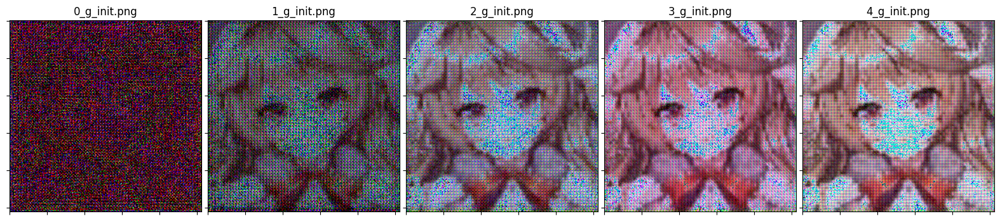

In [30]:
sample_images_filepaths = [os.path.join(img_save_dir, x) for x in os.listdir(img_save_dir)]
sample_images_filepaths = list(filter(lambda x: not 'train' in x, sample_images_filepaths))
sample_images_filepaths.sort(key = lambda x: x.split('_')[0])

images = [cv2.imread(x) for x in sample_images_filepaths]
titles = [os.path.basename(x) for x in sample_images_filepaths]

plot_images(images, titles, figsize=(20., 8.), rows=1, cols=len(images))

# Training GAN

In [31]:
for epoch in range(n_epoch):
    for step, (X, Y) in enumerate(dataset):

        if step > steps_per_epoch:
            break

        with tf.GradientTape(persistent=True) as tape:
            fake_img = model_gen(X)
            fake_logits = model_dis(fake_img)
            real_logits = model_dis(Y)
            fake_feature = model_vgg(fake_img)
            real_feature = model_vgg(Y)

            # Discriminator. loss
            d_loss1 = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(fake_logits, tf.zeros_like(fake_logits)))
            d_loss2 = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(real_logits, tf.ones_like(real_logits)))
            d_loss = d_loss1 + d_loss2

            # Generator. loss
            g_gan_loss = 2e-3 * tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(fake_logits, tf.ones_like(fake_logits)))
            mse_loss   = 2e-1 * tf.reduce_mean(tf.reduce_mean(tf.math.squared_difference(fake_img, Y), axis=-1))
            vgg_loss   = 2e-6 * tf.reduce_mean(tf.reduce_mean(tf.math.squared_difference(fake_feature, real_feature), axis=-1)) #is used to calculate the mean value of the VGG loss across the batch.
            g_loss = mse_loss + vgg_loss + g_gan_loss

            grad = tape.gradient(g_loss, model_gen.trainable_weights)
            g_optimizer.apply_gradients(zip(grad, model_gen.trainable_weights))

            grad = tape.gradient(d_loss, model_dis.trainable_weights)
            d_optimizer.apply_gradients(zip(grad, model_dis.trainable_weights))

        if step % 100 == 0:
            print("Epoch: [{}/{}] step: D.loss: {:.3f}: G.loss: {:.3f}".format(epoch, step , d_loss, g_loss))

        if step == 0:
            img = model_gen.predict(X[0:1])[0]
            img = Image.fromarray(np.uint8(img))
            img.save(os.path.join(img_save_dir, '{}_g_train.png'.format(epoch)))

Epoch: [0/0] step: D.loss: 1.694: G.loss: 370.474
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Epoch: [0/100] step: D.loss: 1.006: G.loss: 256.052
Epoch: [0/200] step: D.loss: 1.006: G.loss: 274.535
Epoch: [0/300] step: D.loss: 1.006: G.loss: 237.198
Epoch: [0/400] step: D.loss: 1.006: G.loss: 130.219
Epoch: [0/500] step: D.loss: 1.006: G.loss: 127.489
Epoch: [1/0] step: D.loss: 1.006: G.loss: 117.553
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
Epoch: [1/100] step: D.loss: 1.006: G.loss: 118.207
Epoch: [1/200] step: D.loss: 1.006: G.loss: 141.716
Epoch: [1/300] step: D.loss: 1.006: G.loss: 118.686
Epoch: [1/400] step: D.loss: 1.006: G.loss: 117.234
Epoch: [1/500] step: D.loss: 1.006: G.loss: 117.010
Epoch: [2/0] step: D.loss: 1.006: G.loss: 107.623
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
Epoch: [2/100] step: D.loss: 1.006: G.loss: 109.351
Epoch: [2/200] step: D.loss: 1.006: G.loss: 130.400
Epoch: [2/300] step: D.loss: 1.006: G.loss: 110.387
Epoch: [2/400] step: D.loss: 1.006: G.loss: 109.878
Epoch: [

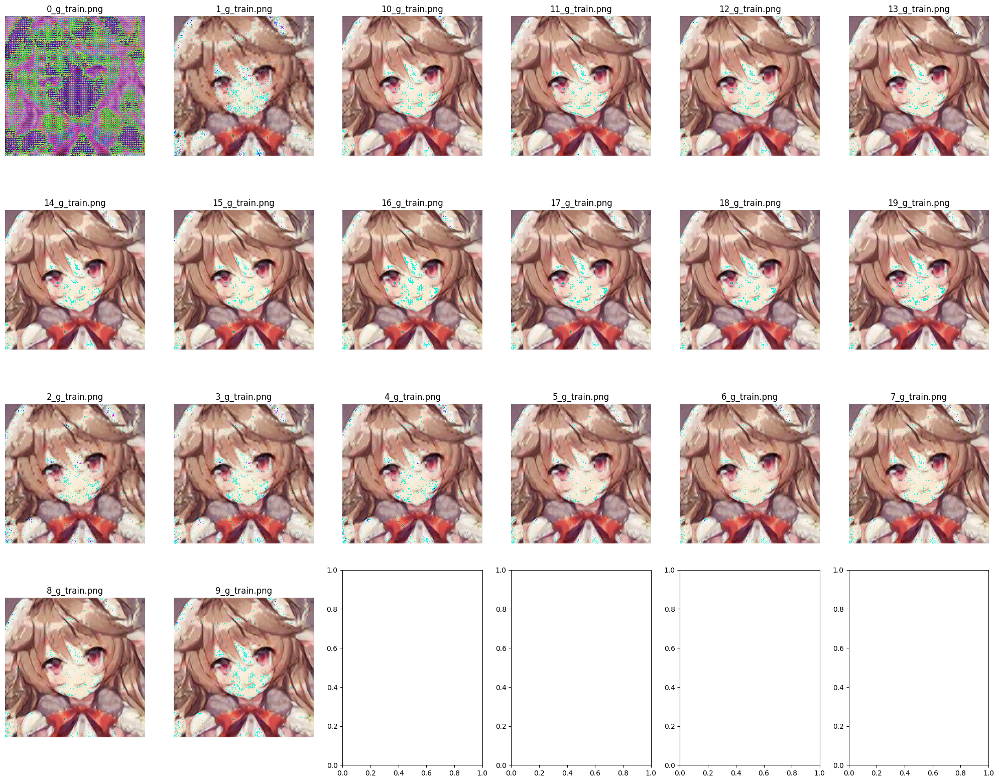

In [42]:
sample_images_filepaths = [os.path.join(img_save_dir, x) for x in os.listdir(img_save_dir)]
sample_images_filepaths = list(filter(lambda x: 'train' in x, sample_images_filepaths))
sample_images_filepaths.sort(key = lambda x: x.split('_')[0])

images = [cv2.imread(x) for x in sample_images_filepaths]
titles = [os.path.basename(x) for x in sample_images_filepaths]

plot_images(images, titles, figsize=(20., 16.), rows=4, cols=6)